In [9]:
import pandas as pd
import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt
%matplotlib inline
import itertools
import seaborn as sns

import random
from tensorflow.keras.preprocessing.image import load_img
import cv2

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras import Sequential

from sklearn.metrics import confusion_matrix, classification_report

In [10]:
df = pd.read_csv("V2_Plant_Seedlings_DataFrame.csv")
df.head()

,filepath,species,image_name,height,width,image_size,square,R_mean,V_mean,B_mean,blur_score,luminosity,sharpness_score
0,C:\V2 Plant Seedlings Dataset\Black-grass\1.png,Black-grass,1.png,138,138,19044,square,105.075247,98.336957,89.631590,151.874492,97.681264,8.365028
1,C:\V2 Plant Seedlings Dataset\Black-grass\10.png,Black-grass,10.png,1040,1040,1081600,square,79.711614,68.709711,60.161677,133.348355,69.527667,367.182903
2,C:\V2 Plant Seedlings Dataset\Black-grass\100.png,Black-grass,100.png,82,82,6724,square,111.598602,103.431440,92.232302,131.975238,102.420781,2.803053
3,C:\V2 Plant Seedlings Dataset\Black-grass\101.png,Black-grass,101.png,156,156,24336,square,84.529668,67.176446,48.901833,132.849602,66.869316,8.426078
4,C:\V2 Plant Seedlings Dataset\Black-grass\102.png,Black-grass,102.png,197,197,38809,square,88.982092,72.174805,53.490505,108.609648,71.549134,12.779936


In [11]:
# Séparer le dataframe en 3 autres train, valid, et test
 
# Dataframe d'entraînement : 80% des données
strat = df['species']
df_train, dataframe = train_test_split(df, train_size= 0.8, 
                                       shuffle= True, 
                                       random_state= 222, 
                                       stratify= strat)

# Dataframes de validation (8% des données) et de test (12% des données)
strat = dataframe['species']
df_valid, df_test = train_test_split(dataframe, 
                                     train_size= 0.4, 
                                     shuffle= True, 
                                     random_state= 222, 
                                     stratify= strat)

In [12]:
# Paramètres
img_size = (224, 224)
channels = 3
color = 'rgb'
img_shape = (img_size[0], img_size[1], channels)
batch_size= 32

#Image data generator : convertit les images en tensors
train_data_generator = ImageDataGenerator(
                                           rescale = 1./255,
                                           horizontal_flip= True,
                                           rotation_range=100,
                                           width_shift_range=0.2, 
                                           height_shift_range = 0.2,
                                           shear_range = 0.6, 
                                           zoom_range = 0.4,
                                           dtype='float32')
                                                 

valid_data_generator = ImageDataGenerator(rescale = 1./255)
test_data_generator = ImageDataGenerator(rescale = 1./255)


# Itérateurs associés à leurs générateurs respectifs à partir des 3 dataframes train, validation & test
train_data = train_data_generator.flow_from_dataframe(df_train, 
                                                             x_col= 'filepath', 
                                                             y_col= 'species', 
                                                             target_size= img_size, 
                                                             class_mode= 'sparse',
                                                             color_mode= color, 
                                                             shuffle= True, 
                                                             batch_size= batch_size)

valid_data = valid_data_generator.flow_from_dataframe(df_valid, 
                                                              x_col= 'filepath', 
                                                              y_col= 'species', 
                                                             target_size= img_size, 
                                                             class_mode= 'sparse',
                                                             color_mode= color, 
                                                             shuffle= True, 
                                                             batch_size= batch_size)

test_data = test_data_generator.flow_from_dataframe(df_test, x_col= 'filepath', 
                                                             y_col= 'species', 
                                                             target_size= img_size, 
                                                             class_mode= 'sparse',
                                                             color_mode= color, 
                                                             shuffle= False, 
                                                             batch_size= batch_size)

Found 4431 validated image filenames belonging to 12 classes.
Found 443 validated image filenames belonging to 12 classes.
Found 665 validated image filenames belonging to 12 classes.


In [13]:
# Affichage du dictionnaire
label2class = {x : y for y, x in train_data.class_indices.items()}
num_classes = len(label2class)
label2class

{0: 'Black-grass',
 1: 'Charlock',
 2: 'Cleavers',
 3: 'Common Chickweed',
 4: 'Common wheat',
 5: 'Fat Hen',
 6: 'Loose Silky-bent',
 7: 'Maize',
 8: 'Scentless Mayweed',
 9: "Shepherd's Purse",
 10: 'Small-flowered Cranesbill',
 11: 'Sugar beet'}

In [23]:
def indice(x, df, num_of_species=12):
    
    """
    Fonction retournant x indices d'images aléatoires par espèce d'un DataFrame
    """
    
    if num_of_species > 12:
        print("Il n'y a que 12 espèces.")
    
    elif x > min(df.species.value_counts()):
        print("Le dataset ne contient que ",df.species.value_counts().sort_values()[0], df.species.value_counts().sort_values().index[0], ".")
    
    else:
            indices = []
            for s in np.random.choice(df.species.unique(), size = num_of_species, replace=False):
                    indices += list(np.random.choice(df[df.species == s].index, size = x, replace=False))
            return indices 

### Modèle et chargement des poids

In [15]:
# Modèle de base pour le Transfer Learning
base_model = VGG19(weights='imagenet', include_top=False, input_shape=img_shape)  #on ne veut que la partie feature extraction

print(base_model.summary())

# Instanciation du modèle selon une construction séquentielle
model = Sequential()
model.add(base_model) 
model.add(GlobalAveragePooling2D(name = "global_average_pooling2d"))
model.add(Dense(1024, activation="relu", name = "dense_1"))
model.add(Dropout(rate=0.2, name ="dropout_1"))
model.add(Dense(512, activation="relu", name = "dense_2"))
model.add(Dropout(rate=0.2, name = "dropout_2"))
model.add(Dense(num_classes, activation="softmax", name = "dense_3"))

model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

### Unfreeze final

In [17]:
model.load_weights("model_TL_VGG19_unfreeze3.h5")
model.compile(tf.keras.optimizers.Adam(learning_rate=0.00001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [33]:
# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, 
                                   verbose=1, mode='min', min_delta=0.01)

checkpoint = ModelCheckpoint(filename, monitor='val_accuracy', verbose=1, 
                             save_best_only=True, mode='max')


callbacks_list = [checkpoint, reduce_lr]

filename= "model_TL_VGG19_unfreezefinal.h5"
history = model.fit(train_data,                   
                                epochs=15,                       
                                validation_data= valid_data,                       
                                steps_per_epoch= df_train.shape[0] // batch_size,   
                                validation_steps = df_valid.shape[0] // batch_size ,
                                callbacks = callbacks_list, verbose=True)

Epoch 1/15
138/138 [==============================] - ETA: 0s - loss: 0.1732 - accuracy: 0.9363 
Epoch 1: val_accuracy improved from -inf to 0.89663, saving model to model_TL_VGG19_unfreezefinal.h5
138/138 [==============================] - 4923s 36s/step - loss: 0.1732 - accuracy: 0.9363 - val_loss: 0.2880 - val_accuracy: 0.8966 - lr: 1.0000e-05
Epoch 2/15
138/138 [==============================] - ETA: 0s - loss: 0.1501 - accuracy: 0.9439 
Epoch 2: val_accuracy improved from 0.89663 to 0.90144, saving model to model_TL_VGG19_unfreezefinal.h5
138/138 [==============================] - 4666s 34s/step - loss: 0.1501 - accuracy: 0.9439 - val_loss: 0.2399 - val_accuracy: 0.9014 - lr: 1.0000e-05
Epoch 3/15
138/138 [==============================] - ETA: 0s - loss: 0.1502 - accuracy: 0.9466 
Epoch 3: val_accuracy improved from 0.90144 to 0.93510, saving model to model_TL_VGG19_unfreezefinal.h5
138/138 [==============================] - 4484s 32s/step - loss: 0.1502 - accuracy: 0.9466 - val_

In [ ]:
# Sauvegarde du modèle final avec les meilleurs poids
model.load_weights("model_TL_VGG19_unfreezefinal.h5")
model.save('VGG19_9507.h5')

# Résumé des perfomances du modèle avec les meilleurs poids

In [ ]:
# Chargement du modèle
model = tf.keras.models.load_model('VGG19_9507.h5')

                           precision    recall  f1-score   support

              Black-grass       0.74      0.86      0.80        37
                 Charlock       1.00      0.96      0.98        54
                 Cleavers       0.91      0.97      0.94        40
         Common Chickweed       0.96      0.99      0.97        86
             Common wheat       0.94      0.94      0.94        31
                  Fat Hen       0.98      0.97      0.98        65
         Loose Silky-bent       0.94      0.91      0.93        91
                    Maize       0.94      0.97      0.95        30
        Scentless Mayweed       0.96      0.96      0.96        73
         Shepherd's Purse       1.00      0.79      0.88        33
Small-flowered Cranesbill       1.00      0.99      0.99        69
               Sugar beet       0.96      0.98      0.97        56

                 accuracy                           0.95       665
                macro avg       0.94      0.94      0.94    

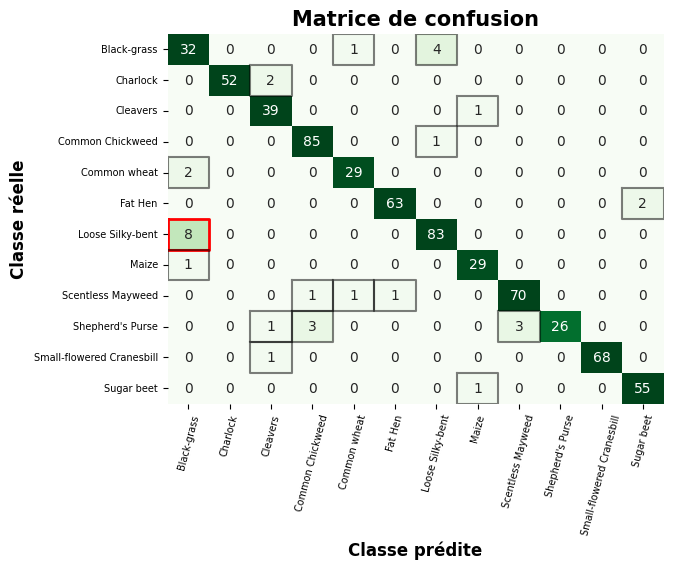

In [13]:
def show_metrics(model):
    
    """
    Prend en entrée un modèle de classification et renvoi la matrice de confusion + le rapport de classification
    associé aux prédictions et labels issus de test_data
    """
        
    y_true = test_data.classes #ou .labels
    y_pred = model.predict(test_data).argmax(axis=-1)
    
    #Evaluation du modèle : rapport de classification & matrice de confusion
    print(classification_report(y_true, y_pred, target_names = test_data.class_indices.keys()))

    matrix = confusion_matrix(y_true, y_pred)
    classes = test_data.class_indices.keys()

    sns.heatmap(matrix, annot=True,cmap="Greens", fmt = 'd',vmin=0,vmax=30,cbar=False)
    tick_marks = np.arange(0.5, len(classes), 1)
    plt.xticks(tick_marks, classes, rotation=75, fontsize = 7)
    plt.yticks(tick_marks, classes, rotation=0, fontsize = 7)

    for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):
        if (i!=j) and (matrix[i,j] !=0):
            if (matrix[i,j] > matrix.mean()):
                plt.plot((j,j,j+1,j+1,j),(i,i+1,i+1,i, i), color="red", linewidth=2)
            else:
                plt.plot((j,j,j+1,j+1,j),(i,i+1,i+1,i, i), color="k", alpha = 0.5)


    plt.ylabel("Classe réelle", fontweight = 'bold', fontsize = 12)
    plt.xlabel("Classe prédite", fontweight = 'bold', fontsize = 12)

    plt.title("Matrice de confusion", fontweight = 'extra bold', fontsize = 15);
    
show_metrics(model)

### Graphique résumant l'entraînement au fil des defreeze

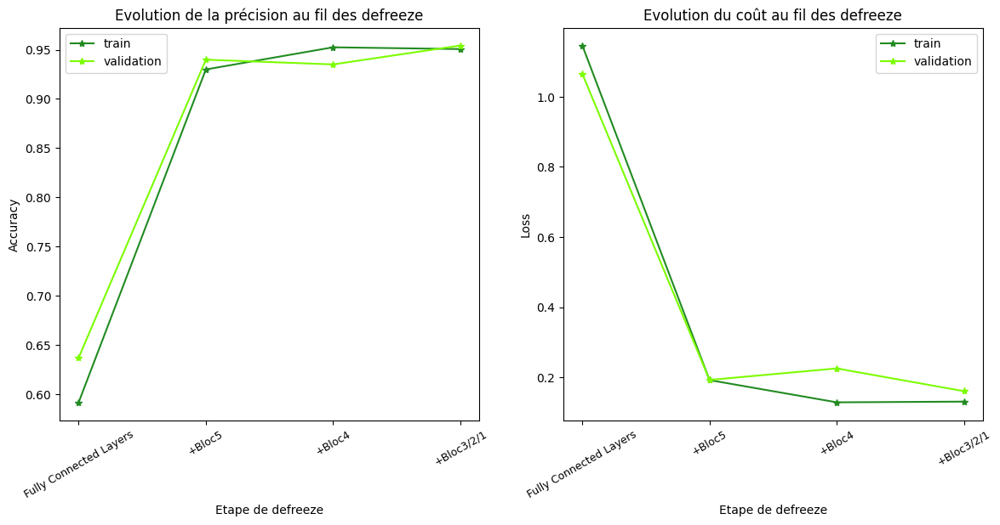

In [3]:
# final freeze, final unfreeze1 (+block5), final unfreeze2 (+block4), final unfreeze3(+block3/2/1)
accuracy = [0.5917, 0.9300, 0.9525, 0.9507]
loss = [1.1462, 0.1918, 0.1284, 0.1304]
val_accuracy = [0.63702, 0.9399, 0.9351, 0.9543]
val_loss = [1.0653, 0.1923, 0.2251, 0.1602]


fig, ax = plt.subplots(1, 2, figsize=(14,6))
ax[0].plot(accuracy, color='forestgreen', marker = "*")                    
ax[0].plot(val_accuracy, color='lawngreen', marker = "*")                      
ax[0].set_title("Evolution de la précision au fil des defreeze")                
ax[0].set_xlabel("Etape de defreeze")           
ax[0].set_ylabel("Accuracy")
ax[0].set_xticks(range(4))
ax[0].set_xticklabels(["Fully Connected Layers", "+Bloc5", "+Bloc4", "+Bloc3/2/1"], rotation=30, fontsize=9)
ax[0].legend(['train', 'validation'], loc='best');                                                               

ax[1].plot(loss, color='forestgreen', marker = "*")
ax[1].plot(val_loss, color='lawngreen', marker = "*")
ax[1].set_title("Evolution du coût au fil des defreeze")
ax[1].set_xlabel("Etape de defreeze")
ax[1].set_ylabel("Loss")
ax[1].set_xticks(range(4))
ax[1].set_xticklabels(["Fully Connected Layers", "+Bloc5", "+Bloc4", "+Bloc3/2/1"], rotation=30, fontsize=9)
ax[1].legend(['train', 'validation'], loc='best');

In [9]:
print("Evaluation du modèle de Deep Learning sur les données d'entraînement  :\n")
model.evaluate(train_data)
print("\n\nEvaluation du modèle de Deep Learning sur les données de validation  :\n")
model.evaluate(valid_data)
print("\n\nEvaluation du modèle de Deep Learning sur les données test  :\n")
model.evaluate(test_data)

Evaluation du modèle de Deep Learning sur les données d'entraînement  :

139/139 [==============================] - 1803s 13s/step - loss: 0.1106 - accuracy: 0.9546
Evaluation du modèle de Deep Learning sur les données de validation  :

14/14 [==============================] - 196s 14s/step - loss: 0.1708 - accuracy: 0.9503
Evaluation du modèle de Deep Learning sur les données test  :

21/21 [==============================] - 290s 14s/step - loss: 0.1925 - accuracy: 0.9489


[0.19253943860530853, 0.9488722085952759]

### GradCAM

In [20]:
# Instanciation d'un modèle A qui prend en entrée une image et renvoie l'output de la partie convolutionnelle
last_conv_layer = base_model.layers[-1]
last_conv_layer_model = tf.keras.Model(base_model.input, last_conv_layer.output)

# Instanciation d'un modèle B qui prend en entrée l'output du modèle A et renvoie la prédiction finale
classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input
    
for layer in model.layers[1:]:
    x = layer(x)   
classifier_model = tf.keras.Model(classifier_input, x)



def create_gradcam(image):
    """
    Fonction générant le gradcam pour une image à partir de last_conv_layer_model & classifier_model
    """
    with tf.GradientTape() as tape:
        inputs = image[np.newaxis, ...]
        last_conv_layer_output = last_conv_layer_model(inputs)
        tape.watch(last_conv_layer_output)   # calcul des gradients des prédictions de la target class jusqu'à la dernière couche convolutionnelle
        preds = classifier_model(last_conv_layer_output)
        top_pred_index = tf.argmax(preds[0])
        top_class_channel = preds[:, top_pred_index]
    
    grads = tape.gradient(top_class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()

    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i] # *les gradients (= l'importance of d'une feature map/ filter) par le vrai feature map (filter) qu'il représente
        
    gradcam = np.mean(last_conv_layer_output, axis=-1) # Moyenne des filtres pour obtenir un seul array  2D
    gradcam = np.clip(gradcam, 0, np.max(gradcam)) / np.max(gradcam)  # cliper les valeurs (~ReLU) + normalisation
    gradcam = cv2.resize(gradcam, (224, 224))
    return gradcam

In [21]:
def show_results(model, df = df_test):
    
    """
    Pour un modèle de classification donné, affiche 5 images aléatoires par espèce avec le filtre Grad-CAM.
    Détermine la prédiction avec le taux de certitude du modèle associée.
    """

    answer = input("Souhaitez-vous afficher le GradCam ? Oui/Non + Appuyer sur enter")
    
    fig, ax = plt.subplots(12, 5, figsize=(20,53), subplot_kw = dict(xticks=[], yticks=[]))

    # Preprocessing des images
    for i, axi in zip(indice(5, df), ax.flat):
        filepath = df["filepath"][i]
        image = np.array(load_img(filepath, target_size=(224, 224, 3)))
        image = image / 255

        # Affichage de l'image
        axi.imshow(image)
        
        # Gradcam ?
        if answer == "Oui":
            gradcam = create_gradcam(image)
            axi.imshow(gradcam, alpha=0.5)
        
        # Rajout du label
        axi.set_title(df['species'][i] + " " + df['image_name'][i].strip(".png"), 
                      loc="center", 
                      fontweight = "bold")

        # Calcul de la prédiction
        image = tf.expand_dims(image, 0)
        probs = model.predict(image, verbose = 0)
        prob = round(probs.max()*100, 1)
        pred = label2class[probs.argmax(axis=-1)[0]]
        
        # Rajout de la prédiction
        axi.text(0.5,-0.15,f"'{pred}' à {prob}%",fontstyle="italic", ha="center", transform=axi.transAxes);

#### Grad-CAM pour 5 images aléatoires par espèce

Souhaitez-vous afficher le GradCam ? Oui/Non + Appuyer sur enterOui


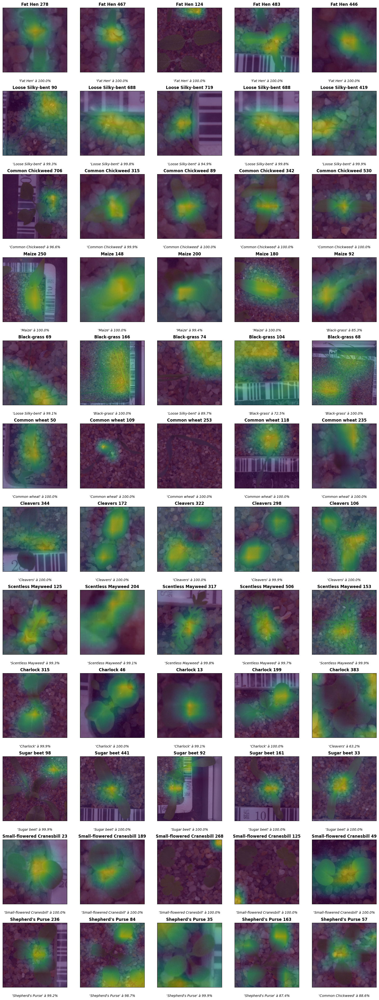

In [24]:
show_results(model)

#### Grad-CAM pour les images mal prédites par le modèle

In [27]:
y_prob = model.predict(test_data)

21/21 [==============================] - 146s 7s/step


In [28]:
def which_ones(model, data = test_data, df = df_test, y_prob = None):
    
    """
    Pour un modèle de classification donné affiche les images mals prédites (avec Grad-CAM ou non) ainsi que l'espèce 
    et la taille de l'image.
    Détermine pour chaque observation la classe prédite et le taux de certitude associé par le modèle.
    L'argument y_prob permet de s'affranchir du temps de calcul des prédictions si ces dernières ont déjà été obtenues.
    """
    
    answer = input("Souhaitez-vous afficher le GradCam ? Oui/Non + Appuyer sur enter")
    
    if y_prob is None:
        # Calcul des prédictions du modèle
        print("Prédiction en cours veuillez patienter:")
        y_prob = model.predict(data)
        print("Prédiction achevée.")
    
    y_pred = y_prob.argmax(axis=-1)
    
    # Classes réelles
    y_true = data.labels

    count = 0
    index_error_list = []
    dataframe_index_error_list = []
    
    # Récupérer les indices des images mal prédites
    for i in range(y_pred.shape[0]):
        if y_pred[i] != y_true[i]:
            count += 1
            index_error_list.append(i)
            
            idx = df.reset_index().loc[i, "index"]
            dataframe_index_error_list.append(idx)
     
    print (f"Le modèle a mal prédit {count} images, soit {round(count/y_pred.shape[0], 2)}%.\n Les voici :")
    print("\nAffichage en cours...")
    
    # Affichage des images en question
    fig, ax = plt.subplots(count // 5 + 1, 5, figsize=(17,4*(count // 5 + 1)), subplot_kw = dict(xticks=[], yticks=[]))
    
    for i, idx, axi in zip(dataframe_index_error_list, index_error_list, ax.flat):
        
        # Preprocessing de l'image
        filepath = df["filepath"][i]
        image = np.array(load_img(filepath, target_size=(224, 224, 3)))
        image = image / 255
        
        # Affichage de l'image
        axi.imshow(image)
        
        # Affichage du GradCam ?
        if answer == "Oui":
            gradcam = create_gradcam(image)
            axi.imshow(gradcam, alpha=0.5)
        
        # Rajout du label
        axi.set_title(df['species'][i] + " " + df['image_name'][i].strip(".png"), 
                      loc="center", 
                      fontweight = "bold")
        
        # Calcul de la prédiction
        prob = round(y_prob[idx].max()*100, 1)
        pred = label2class[y_pred[idx]]
        
        # Rajout de la prédiction + dimensions
        axi.text(0.5,-0.15,f"({df.height[i]}, {df.width[i]})\n'{pred}' à {prob}%",fontstyle="italic", ha="center", transform=axi.transAxes);

Souhaitez-vous afficher le GradCam ? Oui/Non + Appuyer sur enterNon
Le modèle a mal prédit 34 images, soit 0.05%.
 Les voici :

Affichage en cours...


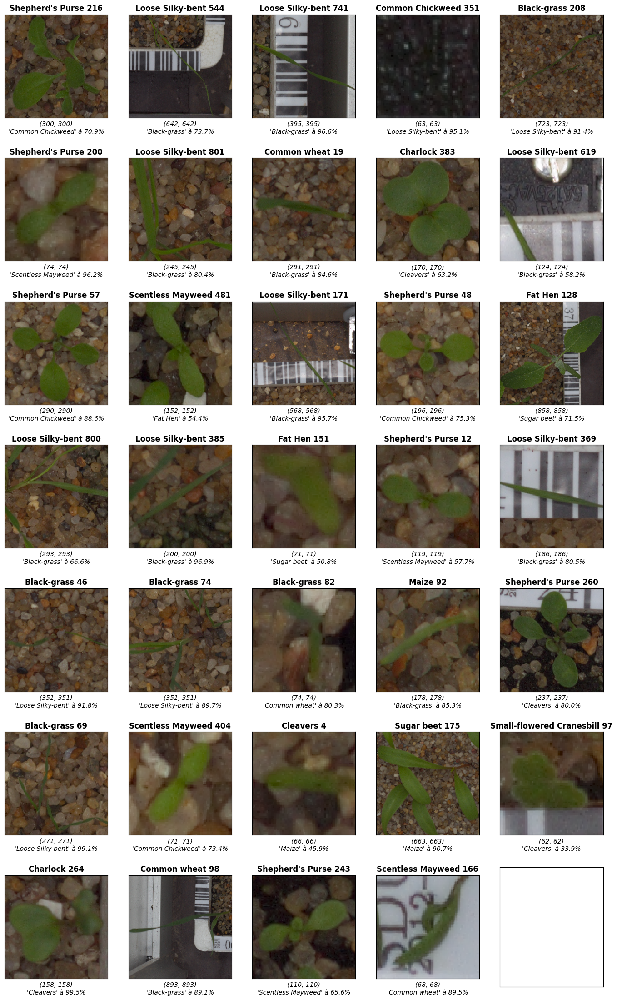

In [29]:
# Sans Grad-CAM afin de mieux observer les images sans heatmap
which_ones(model, y_prob = y_prob)

Souhaitez-vous afficher le GradCam ? Oui/Non + Appuyer sur enterOui
Le modèle a mal prédit 34 images, soit 0.05%.
 Les voici :

Affichage en cours...


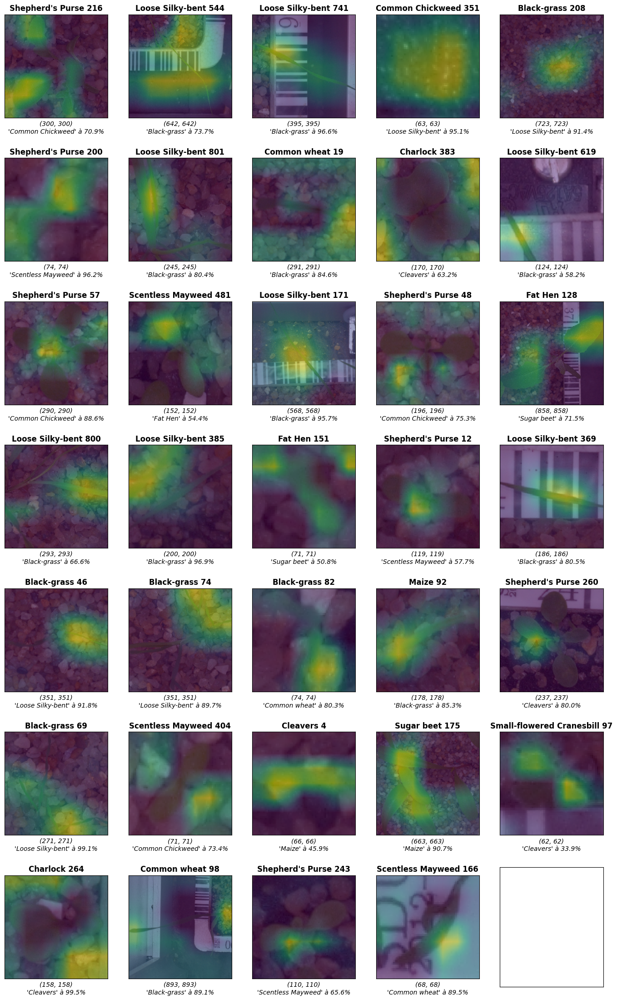

In [30]:
# Avec Grad-CAM
which_ones(model, y_prob = y_prob)